## Absolute astrometric calibration

We now have a combined, science-ready image... sort of.  In reality, doing any sort of scientific analysis on this image as it stands will be a big pain, because it doesn't contain any positional information.  If we wanted to extract information about a particular star or galaxy, or (worse) a whole list of objects, this would be extremely frustrating: we would have to scan the image by eye to find each object, write down its pixel coordinates, and send them one-by-one to our photometry or other analysis code.

Fortunately, the FITS format can encode astrometric (positional) information via the header, enabling us to transform (x,y) to (RA,Dec) and back again for any location in the image.  Basic header keywords encode the position, pixel scale, and rotation of the image (plus the spherical projection to be used); these are fully standardized and supported by nearly all astronomical software.  Additional keywords provide distortion terms to allow for deviations from perfectly rectilinear CCD/optics, although unfortunately there are several conflicting conventions for treating distortions and there is no guarantee that your software will support them correctly.

Solving astrometry requires matching a group of stars detected in your image to the stars in the catalog, and solving (fitting) for the parameters in the system of astrometric equations that relate pixel coordinates (x,y) to world coordinates (RA,Dec).  Doing this by hand is painstaking so we will use tools available that will do the astronomy or us. What we need is just a transformation matrix for going from one coordinate system to the other.

Download the **astrometry net client** module in a different virtual environment to avoid dependency clashes. Ony the following cell requires this module.

`$ pip install astrometry-net-client`

Login to *nova.astrometry.net* and get your API key from profile section.

In [31]:
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from astropy.wcs import WCS
from astropy.io import fits
from astropy.table import Table
from astropy.stats import sigma_clipped_stats
import warnings
import os
import subprocess

warnings.filterwarnings("ignore")

We're using an Astropy Table, read about it from here https://docs.astropy.org/en/stable/api/astropy.table.Table.html. Using it's data is similar to **pandas**.

In [32]:
corr2 = fits.open('/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/astrometry results/20230525184701_corr.fits')

data = corr2[1].data
table = Table(data)

print(table)

     field_x            field_y       ...    FLUX   BACKGROUND
------------------ ------------------ ... --------- ----------
425.69146728515625  1247.198974609375 ... 30665.566   32768.52
     2477.82421875 1199.2796630859375 ... 28430.867  32769.742
   3517.0849609375  2147.009033203125 ... 23230.342  32767.846
 3056.793212890625  1293.394775390625 ... 19991.867  32768.656
321.88177490234375 1641.7708740234375 ...  14238.34  32767.395
 2630.215087890625  2829.039306640625 ...   8856.82  32769.574
   3952.0068359375      3187.41015625 ...   4963.41  32762.684
     567.779296875  773.6665649414062 ... 20542.135  32767.725
1993.0841064453125    2056.3466796875 ...  6592.211   32770.95
  3318.26416015625 1738.6605224609375 ...  6378.383   32768.15
  2415.50927734375  817.7047729492188 ... 6347.7812  32768.797
 3705.277587890625   3691.52587890625 ...  4660.877  32760.412
  1886.80126953125  647.5291748046875 ... 3742.7773  32768.785


Now we'll plot the reference stars the software used to obtain the trasformation to see if it did that correctly

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP' 'DEC--TAN-SIP' 
CRVAL : 211.307708216 54.4599640425 
CRPIX : 1632.02204895 1128.38499451 
CD1_1 CD1_2  : 8.21205550383e-05 -0.000168792166903 
CD2_1 CD2_2  : -0.000168586286434 -8.2216342886e-05 
NAXIS : 0  0


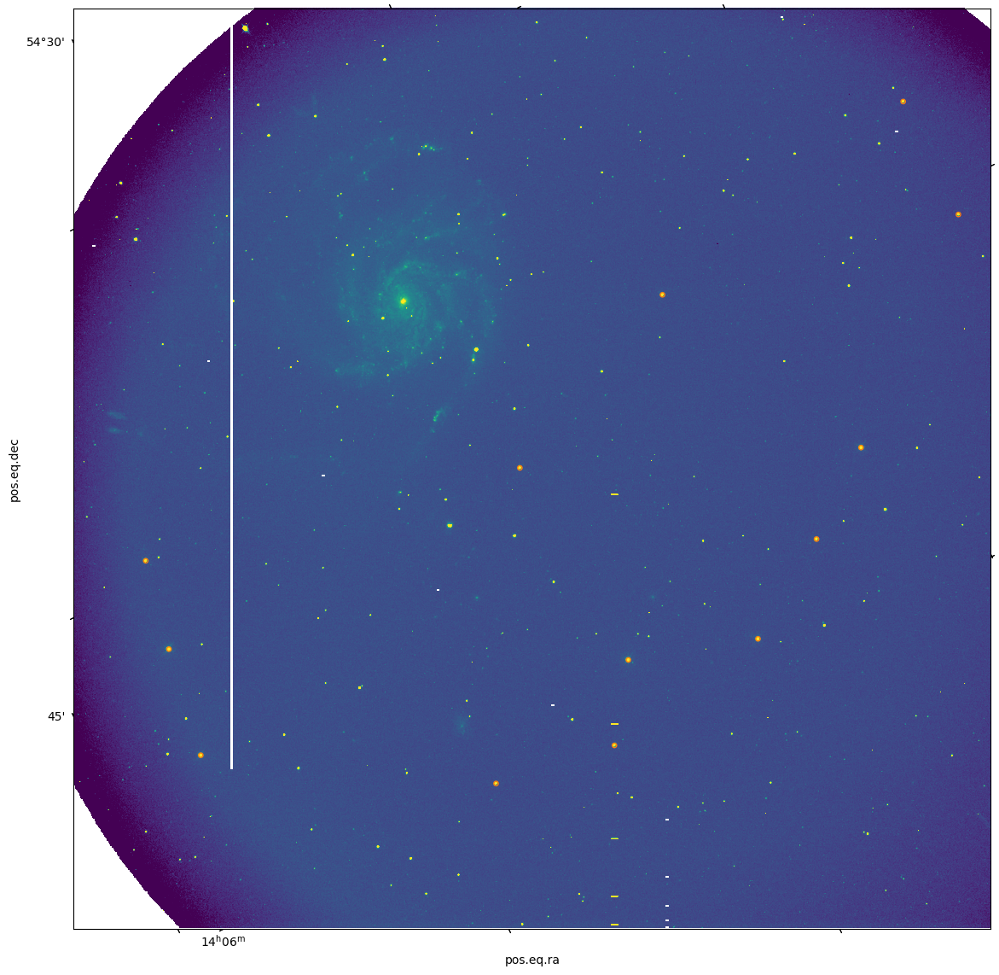

In [33]:
astromFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230525184701-216-RA.proc.fits'
with fits.open(astromFile) as HDUList:
    img = HDUList[0].data
wcsFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/astrometry results/20230525184701_wcs.fits'
with fits.open(wcsFile) as HDUList:
    header = HDUList[0].header
wcs = WCS(header) # the following obtains the transformation matrix from the header
print(wcs)
ra = data['field_ra']
dec = data['field_dec']
# changing the coordinates of reference stars from WCS to pixels using tranformation obtained by solving astrometry
coordsx, coordsy = wcs.all_world2pix(ra, dec, 0) 
patch_list = [Circle((x, y), radius=10, fill=False, ec='C1') for x, y in zip(coordsx, coordsy)]
fig = plt.figure(figsize=(14,14))
ax = plt.subplot(projection=wcs) # changes the coordinate system to WCS
mean, median, std = sigma_clipped_stats(img)
plt.imshow(img, vmin=median-3*std, vmax=median+10*std, origin="lower")
for p in patch_list:
    ax.add_patch(p)
plt.show()

You can see that the reference stars align with our image, hence we must be doing something right.

## Resampling

The above image does not have North up and East to the left, the normal convention for displaying astronomical images.  The easiest way to project an image to the standard reference system is to resample it using SWarp, another piece of external code.  This can be done as follows:

In [34]:
swarpConfigFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/stack.swarp'
procFolder = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing'
weightFile = os.path.join(procFolder, '20230525184701-216-RA.proc.fits')
resampledFile = os.path.join('/Users/jigyasachouhan/Documents/Krittika/KSP/g_band', '20230525184701-216-RA_resampled.proc.fits')
swarpCommand = 'SWarp' # Change this if you get an error below

try:
    #IMAGEOUT_NAME is the output stacked file, RESAMPLE_DIR is the directory where the resampled images are to be stored

    command = '%s %s -c %s -IMAGEOUT_NAME %s -WEIGHTOUT_NAME %s -RESAMPLE_DIR %s' % (swarpCommand, astromFile, swarpConfigFile, resampledFile, weightFile, procFolder)
    print("Executing command: %s" % command)
    print("Processing...")
    rval = subprocess.run(command.split(), check=True, capture_output=True)
    print("Process completed.")
    print(rval.stdout.decode())

except subprocess.CalledProcessError as err:
    print('Could not run SWarp. Can you run it from the terminal?')

Executing command: SWarp /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230525184701-216-RA.proc.fits -c /Users/jigyasachouhan/Documents/Krittika/KSP/stack.swarp -IMAGEOUT_NAME /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/20230525184701-216-RA_resampled.proc.fits -WEIGHTOUT_NAME /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230525184701-216-RA.proc.fits -RESAMPLE_DIR /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing
Processing...
Process completed.



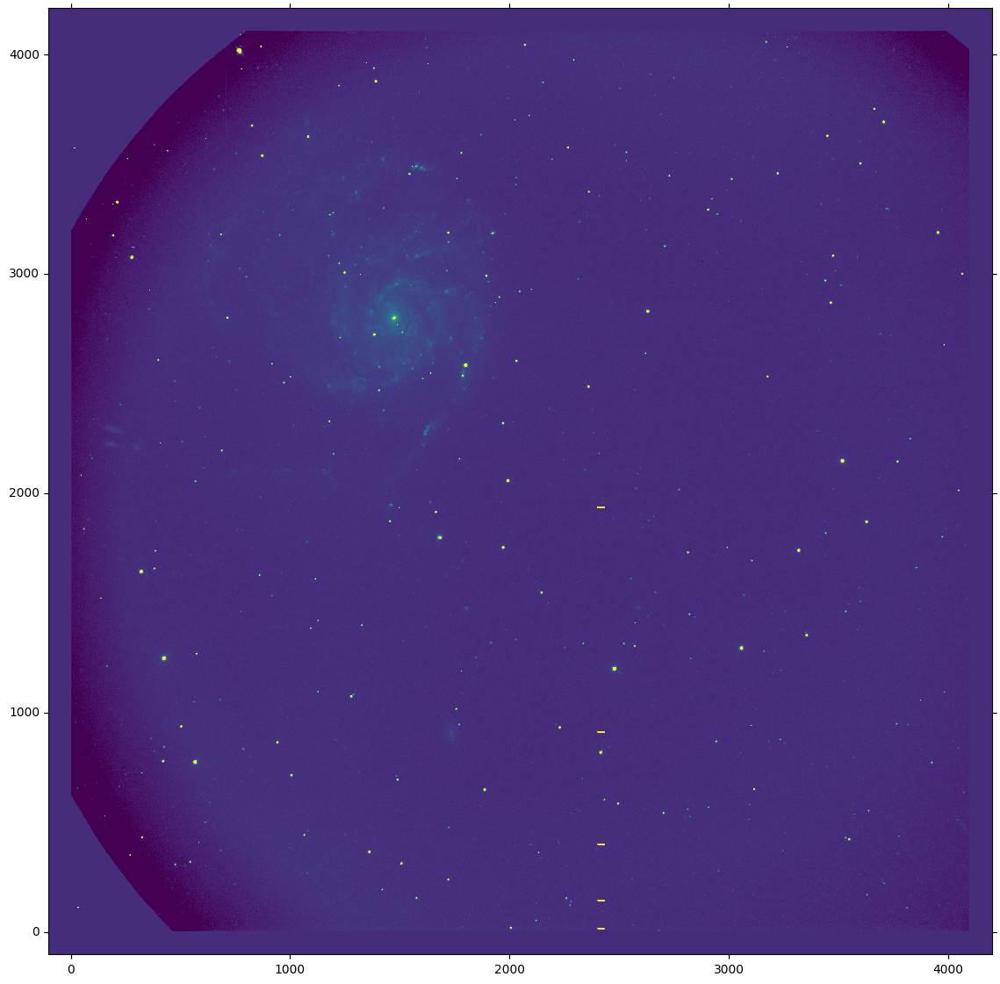

In [35]:
## Display the resampled image

HDUList = fits.open(resampledFile)
wcs = WCS(HDUList[0].header)
resampledData = HDUList[0].data
HDUList.close()

fig = plt.figure(figsize=(14,14))
ax = plt.subplot(projection=wcs)
mean, median, std = sigma_clipped_stats(resampledData)
plt.imshow(resampledData, vmin=mean-3*std, vmax=mean+20*std, origin="lower")
plt.show()


WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP' 'DEC--TAN-SIP' 
CRVAL : 211.378134423 54.1755500269 
CRPIX : 1194.14781189 1301.58377075 
CD1_1 CD1_2  : -0.000187383932133 -7.33479927816e-06 
CD2_1 CD2_2  : -7.33935686327e-06 0.000187351700808 
NAXIS : 0  0


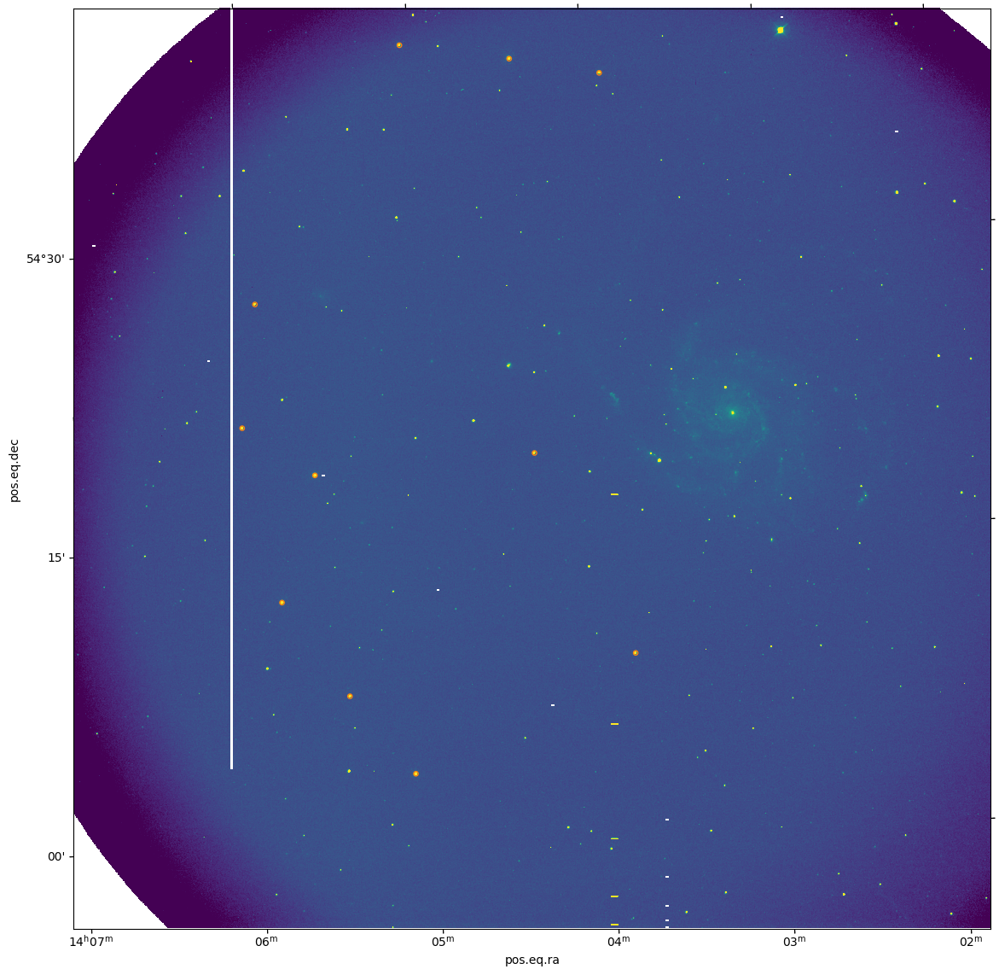

In [36]:
astromFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230527150837-913-RA.proc.fits'
with fits.open(astromFile) as HDUList:
    img = HDUList[0].data
wcsFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/astrometry results/20230527150837_wcs.fits'
with fits.open(wcsFile) as HDUList:
    header = HDUList[0].header
wcs = WCS(header) # the following obtains the transformation matrix from the header
print(wcs)
ra = data['field_ra']
dec = data['field_dec']
# changing the coordinates of reference stars from WCS to pixels using tranformation obtained by solving astrometry
coordsx, coordsy = wcs.all_world2pix(ra, dec, 0) 
patch_list = [Circle((x, y), radius=10, fill=False, ec='C1') for x, y in zip(coordsx, coordsy)]
fig = plt.figure(figsize=(14,14))
ax = plt.subplot(projection=wcs) # changes the coordinate system to WCS
mean, median, std = sigma_clipped_stats(img)
plt.imshow(img, vmin=median-3*std, vmax=median+10*std, origin="lower")
for p in patch_list:
    ax.add_patch(p)
plt.show()

In [37]:
swarpConfigFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/stack.swarp'
procFolder = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing'
weightFile = os.path.join(procFolder, '20230527150837-913-RA.proc.fits')
resampledFile = os.path.join('/Users/jigyasachouhan/Documents/Krittika/KSP/g_band', '20230527150837-913-RA_resampled.proc.fits')
swarpCommand = 'SWarp' # Change this if you get an error below

try:
    #IMAGEOUT_NAME is the output stacked file, RESAMPLE_DIR is the directory where the resampled images are to be stored

    command = '%s %s -c %s -IMAGEOUT_NAME %s -WEIGHTOUT_NAME %s -RESAMPLE_DIR %s' % (swarpCommand, astromFile, swarpConfigFile, resampledFile, weightFile, procFolder)
    print("Executing command: %s" % command)
    print("Processing...")
    rval = subprocess.run(command.split(), check=True, capture_output=True)
    print("Process completed.")
    print(rval.stdout.decode())

except subprocess.CalledProcessError as err:
    print('Could not run SWarp. Can you run it from the terminal?')

Executing command: SWarp /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230527150837-913-RA.proc.fits -c /Users/jigyasachouhan/Documents/Krittika/KSP/stack.swarp -IMAGEOUT_NAME /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/20230527150837-913-RA_resampled.proc.fits -WEIGHTOUT_NAME /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230527150837-913-RA.proc.fits -RESAMPLE_DIR /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing
Processing...
Process completed.



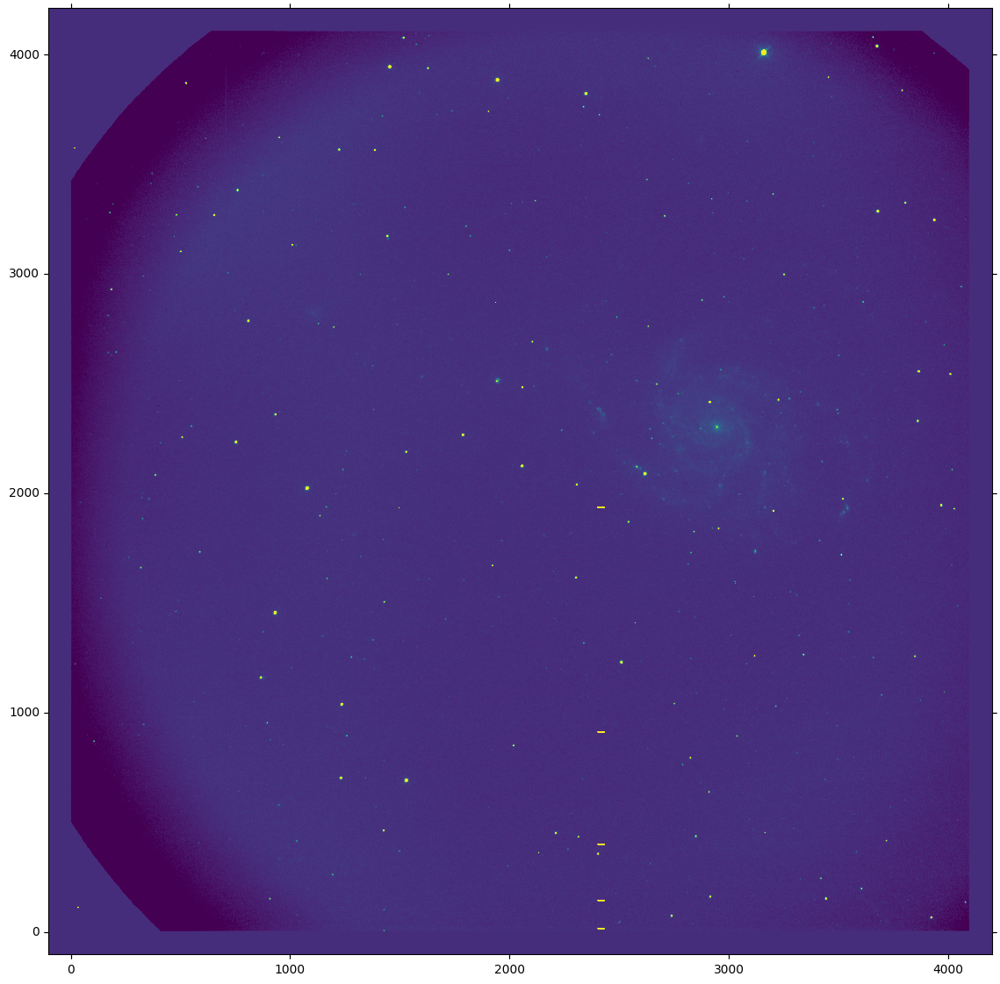

In [38]:
## Display the resampled image

HDUList = fits.open(resampledFile)
wcs = WCS(HDUList[0].header)
resampledData = HDUList[0].data
HDUList.close()

fig = plt.figure(figsize=(14,14))
ax = plt.subplot(projection=wcs)
mean, median, std = sigma_clipped_stats(resampledData)
plt.imshow(resampledData, vmin=mean-3*std, vmax=mean+20*std, origin="lower")
plt.show()


WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP' 'DEC--TAN-SIP' 
CRVAL : 211.378167215 54.1755339628 
CRPIX : 3037.34710693 1571.98928833 
CD1_1 CD1_2  : 7.01148691615e-05 -0.000173858549223 
CD2_1 CD2_2  : -0.000173818726521 -7.01779259846e-05 
NAXIS : 0  0


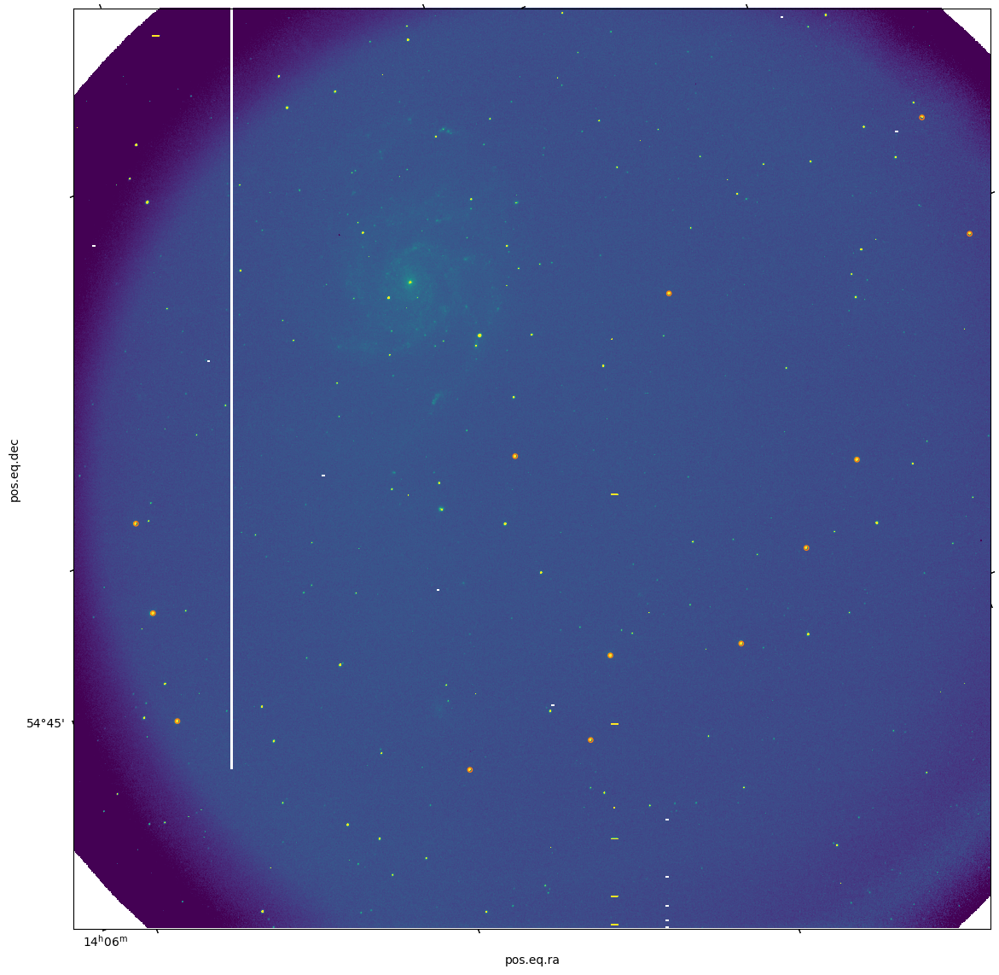

In [39]:
astromFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230530180249-785-RA.proc.fits'
with fits.open(astromFile) as HDUList:
    img = HDUList[0].data
wcsFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/astrometry results/20230530180249_wcs.fits'
with fits.open(wcsFile) as HDUList:
    header = HDUList[0].header
wcs = WCS(header) # the following obtains the transformation matrix from the header
print(wcs)
ra = data['field_ra']
dec = data['field_dec']
# changing the coordinates of reference stars from WCS to pixels using tranformation obtained by solving astrometry
coordsx, coordsy = wcs.all_world2pix(ra, dec, 0) 
patch_list = [Circle((x, y), radius=10, fill=False, ec='C1') for x, y in zip(coordsx, coordsy)]
fig = plt.figure(figsize=(14,14))
ax = plt.subplot(projection=wcs) # changes the coordinate system to WCS
mean, median, std = sigma_clipped_stats(img)
plt.imshow(img, vmin=median-3*std, vmax=median+10*std, origin="lower")
for p in patch_list:
    ax.add_patch(p)
plt.show()

In [40]:
swarpConfigFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/stack.swarp'
procFolder = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing'
weightFile = os.path.join(procFolder, '20230530180249-785-RA.proc.fits')
resampledFile = os.path.join('/Users/jigyasachouhan/Documents/Krittika/KSP/g_band', '20230530180249-785-RA_resampled.proc.fits')
swarpCommand = 'SWarp' # Change this if you get an error below

try:
    #IMAGEOUT_NAME is the output stacked file, RESAMPLE_DIR is the directory where the resampled images are to be stored

    command = '%s %s -c %s -IMAGEOUT_NAME %s -WEIGHTOUT_NAME %s -RESAMPLE_DIR %s' % (swarpCommand, astromFile, swarpConfigFile, resampledFile, weightFile, procFolder)
    print("Executing command: %s" % command)
    print("Processing...")
    rval = subprocess.run(command.split(), check=True, capture_output=True)
    print("Process completed.")
    print(rval.stdout.decode())

except subprocess.CalledProcessError as err:
    print('Could not run SWarp. Can you run it from the terminal?')

Executing command: SWarp /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230530180249-785-RA.proc.fits -c /Users/jigyasachouhan/Documents/Krittika/KSP/stack.swarp -IMAGEOUT_NAME /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/20230530180249-785-RA_resampled.proc.fits -WEIGHTOUT_NAME /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230530180249-785-RA.proc.fits -RESAMPLE_DIR /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing
Processing...
Process completed.



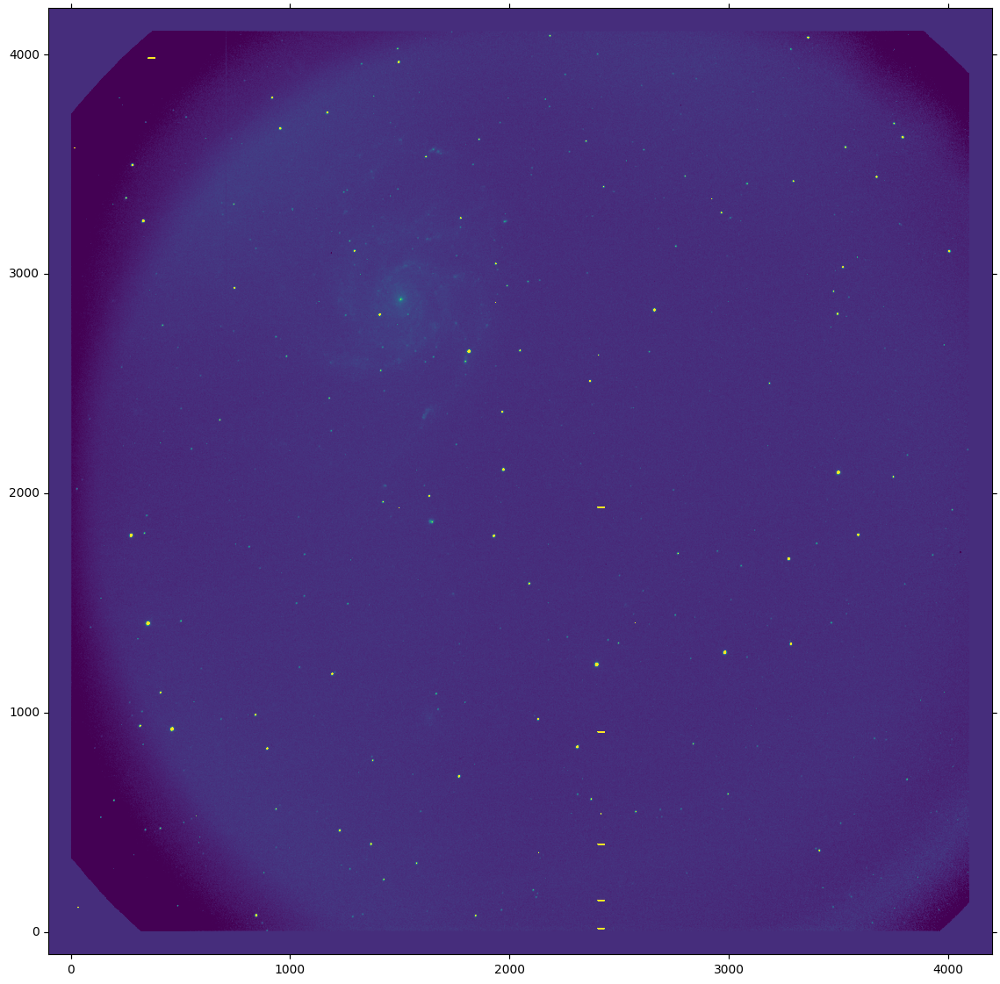

In [41]:
## Display the resampled image

HDUList = fits.open(resampledFile)
wcs = WCS(HDUList[0].header)
resampledData = HDUList[0].data
HDUList.close()

fig = plt.figure(figsize=(14,14))
ax = plt.subplot(projection=wcs)
mean, median, std = sigma_clipped_stats(resampledData)
plt.imshow(resampledData, vmin=mean-3*std, vmax=mean+20*std, origin="lower")
plt.show()

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP' 'DEC--TAN-SIP' 
CRVAL : 211.307727904 54.4600916594 
CRPIX : 1250.25442505 2637.91812134 
CD1_1 CD1_2  : -0.000178271992995 -5.86526774506e-05 
CD2_1 CD2_2  : -5.8802400323e-05 0.000178091583073 
NAXIS : 0  0


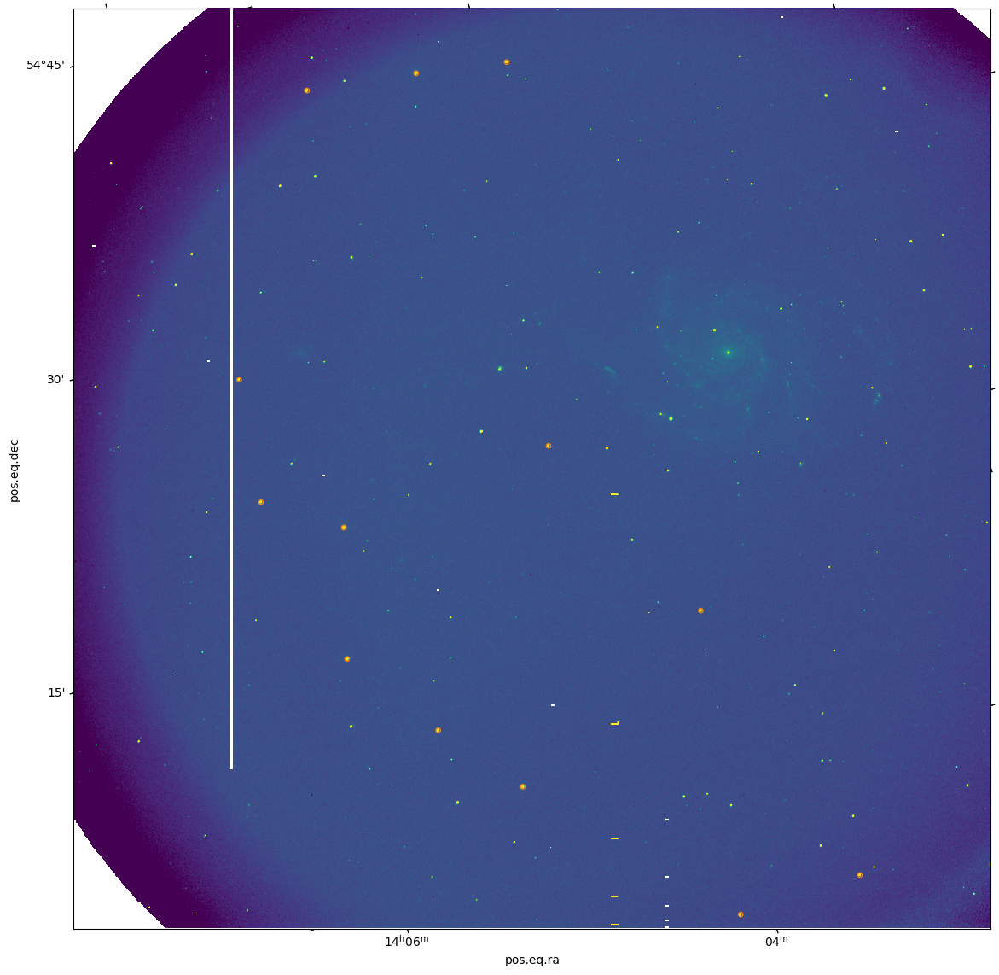

In [42]:
astromFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230603150337-154-RA.proc.fits'
with fits.open(astromFile) as HDUList:
    img = HDUList[0].data
wcsFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/astrometry results/20230603150337_wcs.fits'
with fits.open(wcsFile) as HDUList:
    header = HDUList[0].header
wcs = WCS(header) # the following obtains the transformation matrix from the header
print(wcs)
ra = data['field_ra']
dec = data['field_dec']
# changing the coordinates of reference stars from WCS to pixels using tranformation obtained by solving astrometry
coordsx, coordsy = wcs.all_world2pix(ra, dec, 0) 
patch_list = [Circle((x, y), radius=10, fill=False, ec='C1') for x, y in zip(coordsx, coordsy)]
fig = plt.figure(figsize=(14,14))
ax = plt.subplot(projection=wcs) # changes the coordinate system to WCS
mean, median, std = sigma_clipped_stats(img)
plt.imshow(img, vmin=median-3*std, vmax=median+10*std, origin="lower")
for p in patch_list:
    ax.add_patch(p)
plt.show()

In [43]:
swarpConfigFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/stack.swarp'
procFolder = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing'
weightFile = os.path.join(procFolder, '20230603150337-154-RA.proc.fits')
resampledFile = os.path.join('/Users/jigyasachouhan/Documents/Krittika/KSP/g_band', '20230603150337-154-RA_resampled.proc.fits')
swarpCommand = 'SWarp' # Change this if you get an error below

try:
    #IMAGEOUT_NAME is the output stacked file, RESAMPLE_DIR is the directory where the resampled images are to be stored

    command = '%s %s -c %s -IMAGEOUT_NAME %s -WEIGHTOUT_NAME %s -RESAMPLE_DIR %s' % (swarpCommand, astromFile, swarpConfigFile, resampledFile, weightFile, procFolder)
    print("Executing command: %s" % command)
    print("Processing...")
    rval = subprocess.run(command.split(), check=True, capture_output=True)
    print("Process completed.")
    print(rval.stdout.decode())

except subprocess.CalledProcessError as err:
    print('Could not run SWarp. Can you run it from the terminal?')

Executing command: SWarp /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230603150337-154-RA.proc.fits -c /Users/jigyasachouhan/Documents/Krittika/KSP/stack.swarp -IMAGEOUT_NAME /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/20230603150337-154-RA_resampled.proc.fits -WEIGHTOUT_NAME /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230603150337-154-RA.proc.fits -RESAMPLE_DIR /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing
Processing...
Process completed.



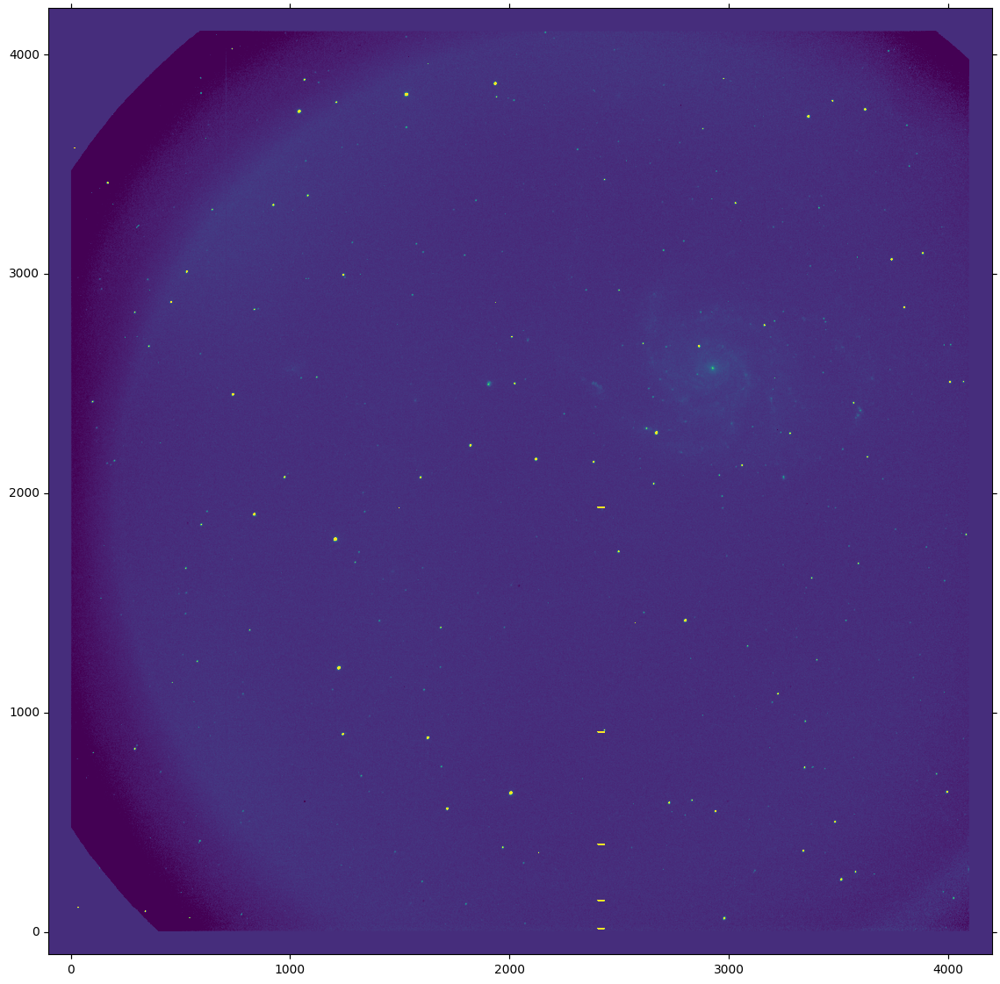

In [44]:
## Display the resampled image

HDUList = fits.open(resampledFile)
wcs = WCS(HDUList[0].header)
resampledData = HDUList[0].data
HDUList.close()

fig = plt.figure(figsize=(14,14))
ax = plt.subplot(projection=wcs)
mean, median, std = sigma_clipped_stats(resampledData)
plt.imshow(resampledData, vmin=mean-3*std, vmax=mean+20*std, origin="lower")
plt.show()

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN-SIP' 'DEC--TAN-SIP' 
CRVAL : 211.378356065 54.1754489463 
CRPIX : 3171.85913086 914.761306763 
CD1_1 CD1_2  : 5.734740571e-05 -0.000178416713538 
CD2_1 CD2_2  : -0.000178403976392 -5.75112849658e-05 
NAXIS : 0  0


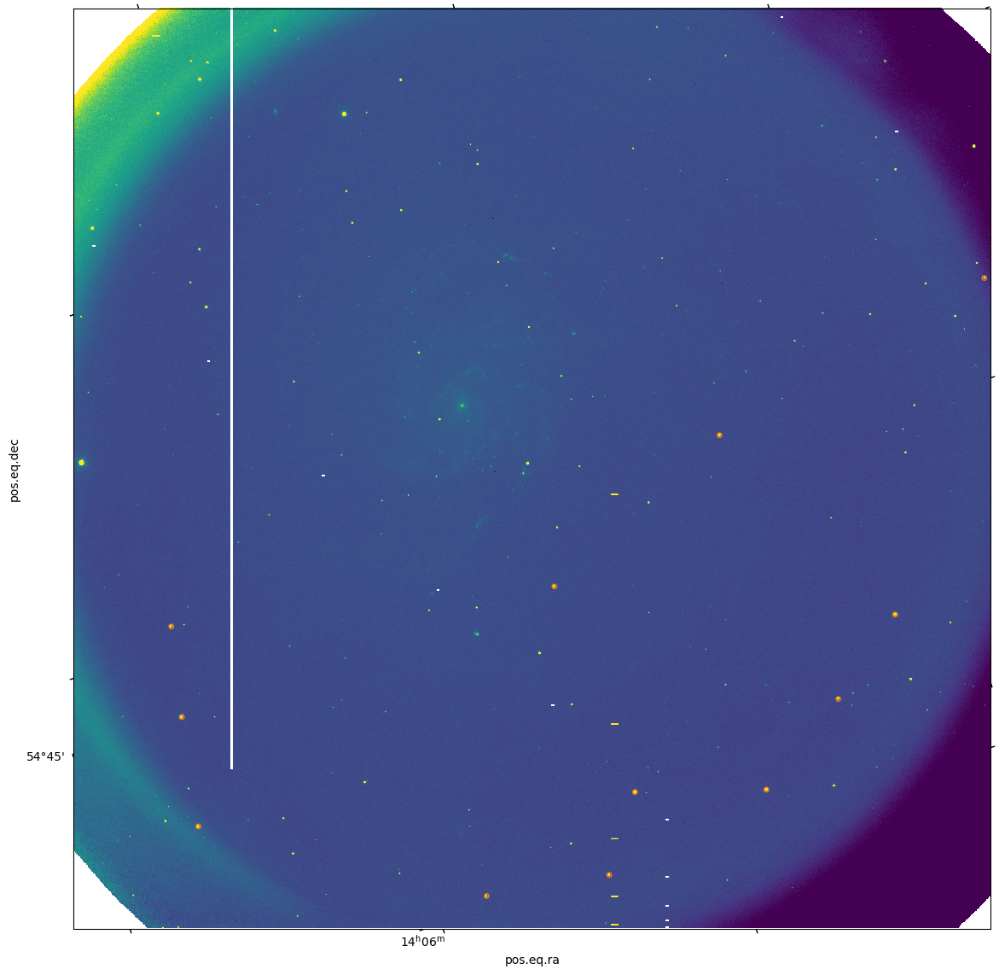

In [45]:
astromFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230605172106-597-RA.proc.fits'
with fits.open(astromFile) as HDUList:
    img = HDUList[0].data
wcsFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/astrometry results/20230605172106_wcs.fits'
with fits.open(wcsFile) as HDUList:
    header = HDUList[0].header
wcs = WCS(header) # the following obtains the transformation matrix from the header
print(wcs)
ra = data['field_ra']
dec = data['field_dec']
# changing the coordinates of reference stars from WCS to pixels using tranformation obtained by solving astrometry
coordsx, coordsy = wcs.all_world2pix(ra, dec, 0) 
patch_list = [Circle((x, y), radius=10, fill=False, ec='C1') for x, y in zip(coordsx, coordsy)]
fig = plt.figure(figsize=(14,14))
ax = plt.subplot(projection=wcs) # changes the coordinate system to WCS
mean, median, std = sigma_clipped_stats(img)
plt.imshow(img, vmin=median-3*std, vmax=median+10*std, origin="lower")
for p in patch_list:
    ax.add_patch(p)
plt.show()

In [46]:
swarpConfigFile = '/Users/jigyasachouhan/Documents/Krittika/KSP/stack.swarp'
procFolder = '/Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing'
weightFile = os.path.join(procFolder, '20230605172106-597-RA.proc.fits')
resampledFile = os.path.join('/Users/jigyasachouhan/Documents/Krittika/KSP/g_band', '20230605172106-597-RA_resampled.proc.fits')
swarpCommand = 'SWarp' # Change this if you get an error below

try:
    #IMAGEOUT_NAME is the output stacked file, RESAMPLE_DIR is the directory where the resampled images are to be stored

    command = '%s %s -c %s -IMAGEOUT_NAME %s -WEIGHTOUT_NAME %s -RESAMPLE_DIR %s' % (swarpCommand, astromFile, swarpConfigFile, resampledFile, weightFile, procFolder)
    print("Executing command: %s" % command)
    print("Processing...")
    rval = subprocess.run(command.split(), check=True, capture_output=True)
    print("Process completed.")
    print(rval.stdout.decode())

except subprocess.CalledProcessError as err:
    print('Could not run SWarp. Can you run it from the terminal?')

Executing command: SWarp /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230605172106-597-RA.proc.fits -c /Users/jigyasachouhan/Documents/Krittika/KSP/stack.swarp -IMAGEOUT_NAME /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/20230605172106-597-RA_resampled.proc.fits -WEIGHTOUT_NAME /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing/20230605172106-597-RA.proc.fits -RESAMPLE_DIR /Users/jigyasachouhan/Documents/Krittika/KSP/g_band/processing
Processing...
Process completed.



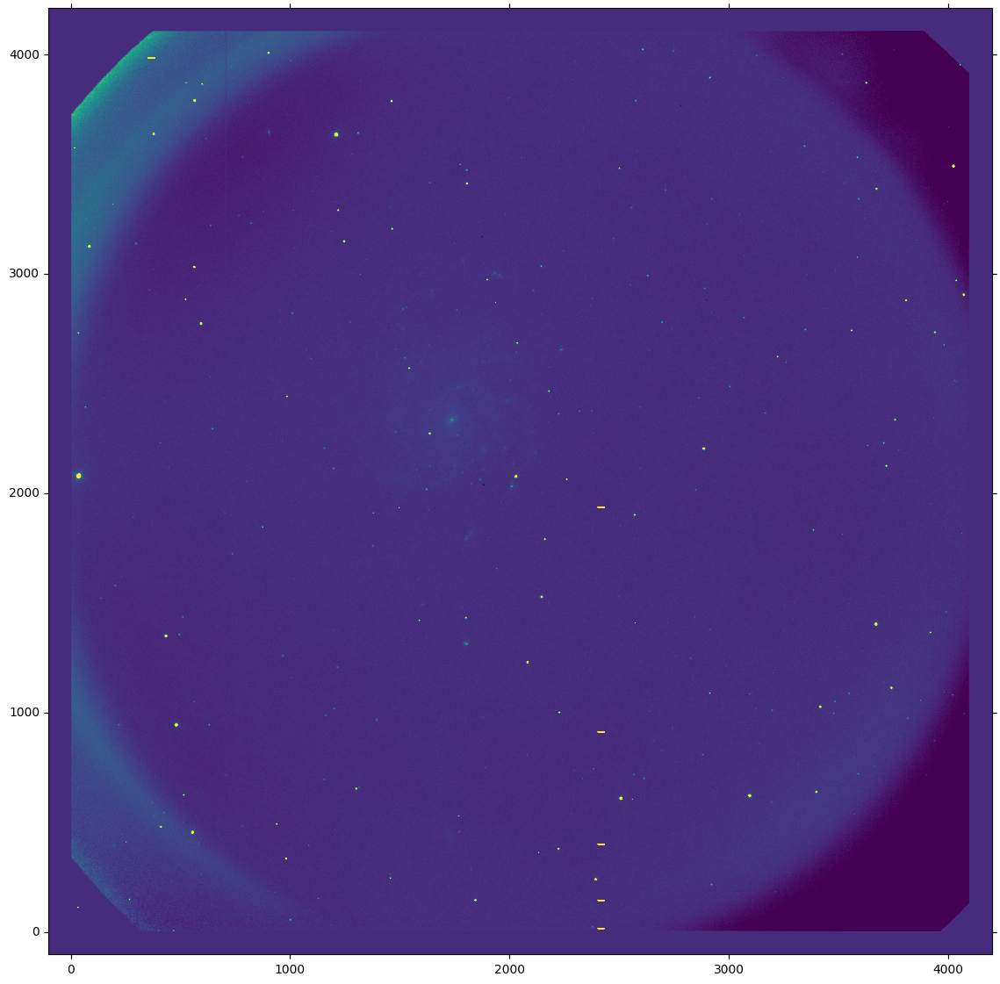

In [47]:
## Display the resampled image

HDUList = fits.open(resampledFile)
wcs = WCS(HDUList[0].header)
resampledData = HDUList[0].data
HDUList.close()

fig = plt.figure(figsize=(14,14))
ax = plt.subplot(projection=wcs)
mean, median, std = sigma_clipped_stats(resampledData)
plt.imshow(resampledData, vmin=mean-3*std, vmax=mean+20*std, origin="lower")
plt.show()